In [1]:
# conda env cellrank2
import palantir
import scanpy as sc
import pandas as pd
import os

# Plotting
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scvelo as scv
import loompy as lmp
import anndata
import cellrank as cr

In [2]:
adata=scv.read("/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Data/Byst_pseudotime.h5ad")

# Palantir를 이용하여 PD-1 initial -> pTH2 terminal pseudotime predict

In [16]:
# pseudotime 0에 가까운 PD-1 확인
mask = (adata.obs['velocity_pseudotime'] < 0.5) & (adata.obs['celltype_detail'] == "PD-1_high")

In [17]:
# 조건을 만족하는 세포의 이름 (index) 리스트로 추출
selected_cells = adata.obs.index[mask].tolist()

# 결과 확인 (일부 미리보기)
print(f"선택된 세포 수: {len(selected_cells)}")
print("예시 세포 ID:", selected_cells[:20])  # 처음 5개만 출력

선택된 세포 수: 298
예시 세포 ID: ['AAACGGGCAGGG-MTC', 'AAAGTAGCAAAG-MTC', 'AACACGTGTACA-MTC', 'AACTCTTAGCGT-MTC', 'AACTGGTTCTGG-MTC', 'AAGACCTCACAA-MTC', 'AAGACCTCAGCT-MTC', 'AAGGAGCAGCCA-MTC', 'AAGGCAGTCAAA-MTC', 'AATCCAGCAAAC-MTC', 'ACACCGGAGTTA-MTC', 'ACAGCTATCAAC-MTC', 'ACATGGTCATAG-MTC', 'ACCAGTAAGTAC-MTC', 'ACCGTAACAAGT-MTC', 'ACGATACGTCAG-MTC', 'ACGCCAGGTAGC-MTC', 'ACGCCGATCTTG-MTC', 'ACGGCCAAGAGG-MTC', 'ACGGCCATCTAC-MTC']


In [18]:
# pseudotime 1에 가까운 Th2 like 확인
mask = (adata.obs['velocity_pseudotime'] > 0.8) & (adata.obs['celltype'] == "Th2-like") & (adata.obs['batch'] == "IL7+IL25+IL33")
# 조건을 만족하는 세포의 이름 (index) 리스트로 추출
selected_cells = adata.obs.index[mask].tolist()

# 결과 확인 (일부 미리보기)
print(f"선택된 세포 수: {len(selected_cells)}")
print("예시 세포 ID:", selected_cells[:30])  # 처음 5개만 출력

선택된 세포 수: 609
예시 세포 ID: ['AAAGGGCTCCGG-IL7+IL25+IL33', 'AAAGTGATCGGT-IL7+IL25+IL33', 'AACAAAGAGACG-IL7+IL25+IL33', 'AACAAAGGTGCT-IL7+IL25+IL33', 'AACAACCTCACC-IL7+IL25+IL33', 'AACAAGAAGAGT-IL7+IL25+IL33', 'AACCAACTCTCC-IL7+IL25+IL33', 'AACCATGCAGAG-IL7+IL25+IL33', 'AACCTTTAGAAA-IL7+IL25+IL33', 'AACGGGAAGTCA-IL7+IL25+IL33', 'AACGGGAGTGTA-IL7+IL25+IL33', 'AACGTCAAGGTA-IL7+IL25+IL33', 'AACTTCTCATAT-IL7+IL25+IL33', 'AAGAACACAGGT-IL7+IL25+IL33', 'AAGATAGAGGCG-IL7+IL25+IL33', 'AAGCATCGTGTT-IL7+IL25+IL33', 'AAGCCATAGCAG-IL7+IL25+IL33', 'AAGCGAGAGTGC-IL7+IL25+IL33', 'AAGCGTTGTAGT-IL7+IL25+IL33', 'AAGGAATTCGGA-IL7+IL25+IL33', 'AAGTACCGTTCA-IL7+IL25+IL33', 'AAGTCGTGTGCA-IL7+IL25+IL33', 'AAGTGAAGTATA-IL7+IL25+IL33', 'AAGTTCGAGAGG-IL7+IL25+IL33', 'AAGTTCGTCTTA-IL7+IL25+IL33', 'AATCACGCAATG-1-IL7+IL25+IL33', 'AATCACGCACCG-IL7+IL25+IL33', 'AATGAAGGTCGC-IL7+IL25+IL33', 'AATGGCTTCGTG-IL7+IL25+IL33', 'ACAACCAGTATG-IL7+IL25+IL33']


In [19]:
# pseudotime 1에 가까운 Th1 like 확인
mask = (adata.obs['velocity_pseudotime'] > 0.7) & (adata.obs['celltype'] == "Th1-like") & (adata.obs['batch'] == "IL7+IL25+IL33")
# 조건을 만족하는 세포의 이름 (index) 리스트로 추출
selected_cells = adata.obs.index[mask].tolist()

# 결과 확인 (일부 미리보기)
print(f"선택된 세포 수: {len(selected_cells)}")
print("예시 세포 ID:", selected_cells[:30])  # 처음 5개만 출력

선택된 세포 수: 229
예시 세포 ID: ['AAACCCATCCTC-IL7+IL25+IL33', 'AAAGGTAAGTAC-IL7+IL25+IL33', 'AAAGTCCTCCCA-IL7+IL25+IL33', 'AACAACCCAAGC-IL7+IL25+IL33', 'AACAAGAAGCCG-IL7+IL25+IL33', 'AACCTGATCGGC-IL7+IL25+IL33', 'AACGGGATCGTC-IL7+IL25+IL33', 'AAGACTCCACGG-IL7+IL25+IL33', 'AATCGTGGTTTG-IL7+IL25+IL33', 'ACAACCATCGGT-IL7+IL25+IL33', 'ACACAGTCAAAT-IL7+IL25+IL33', 'ACACGCGCAGGC-IL7+IL25+IL33', 'ACACTGAGTGAA-IL7+IL25+IL33', 'ACAGAAAGTGTC-IL7+IL25+IL33', 'ACAGGGAGTAAC-IL7+IL25+IL33', 'ACATGCACACTC-IL7+IL25+IL33', 'ACCCAAAGTGTT-IL7+IL25+IL33', 'ACCCTCATCCTA-IL7+IL25+IL33', 'ACGGAAGCACAG-IL7+IL25+IL33', 'ACGGGTCTCTGG-IL7+IL25+IL33', 'ACTACGAGTTGT-IL7+IL25+IL33', 'ACTATTCTCGCA-IL7+IL25+IL33', 'AGAACCTCAGAA-IL7+IL25+IL33', 'AGAAGTATCATT-IL7+IL25+IL33', 'AGACTCAGTCCG-IL7+IL25+IL33', 'AGAGCCCTCTGG-IL7+IL25+IL33', 'AGGACGATCTCA-IL7+IL25+IL33', 'AGGATCTGTGCA-IL7+IL25+IL33', 'AGGTCATAGCAA-IL7+IL25+IL33', 'AGGTTGTCAGTT-IL7+IL25+IL33']


In [20]:
# pseudotime 1에 가까운 Resting 확인
mask = (adata.obs['velocity_pseudotime'] > 0.9) & (adata.obs['celltype'] == "Resting") & (adata.obs['batch'] == "IL7+IL25+IL33")
# 조건을 만족하는 세포의 이름 (index) 리스트로 추출
selected_cells = adata.obs.index[mask].tolist()

# 결과 확인 (일부 미리보기)
print(f"선택된 세포 수: {len(selected_cells)}")
print("예시 세포 ID:", selected_cells[:30])  # 처음 5개만 출력

선택된 세포 수: 1
예시 세포 ID: ['GGGATGAGTATG-IL7+IL25+IL33']


In [22]:
start_cell = 'CCTACCAGTTTA-MTC'
terminal_states = pd.Series(
    ["Th2", "Th1","Resting"],
    index=["CCTCAGTGTATT-IL7+IL25+IL33","ACGGGTCTCTGG-IL7+IL25+IL33","GGGATGAGTATG-IL7+IL25+IL33"],
)

In [23]:
dm_res = palantir.utils.run_diffusion_maps(adata, n_components=5)

In [24]:
pr_res = palantir.core.run_palantir(adata,start_cell, terminal_states=terminal_states,eigvec_key='DM_EigenVectors')

Sampling and flocking waypoints...
Time for determining waypoints: 0.10783086220423381 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.6006116747856141 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


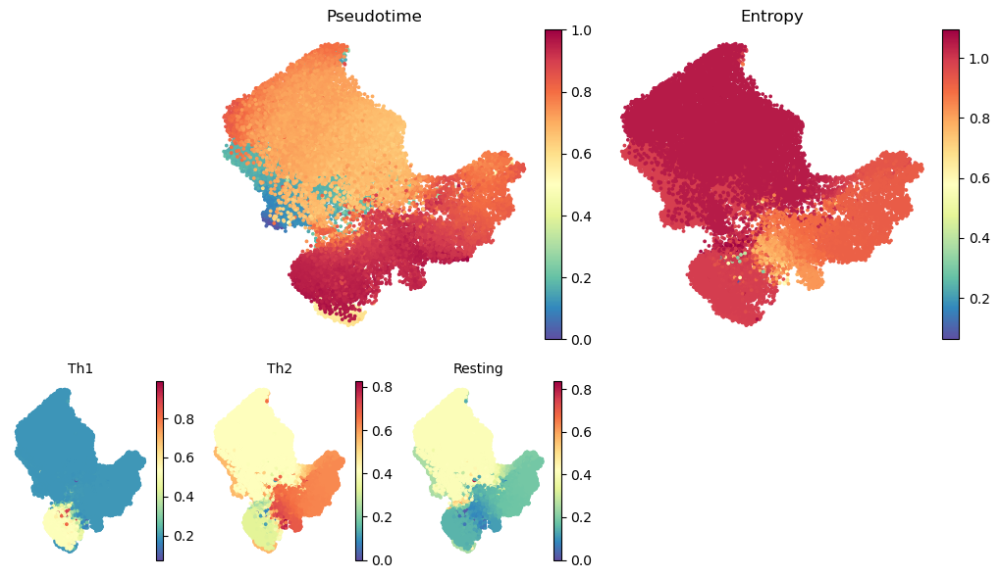

In [25]:
palantir.plot.plot_palantir_results(adata, s=3)
plt.show()

In [26]:
masks = palantir.presults.select_branch_cells(adata, q=.01, eps=.01)

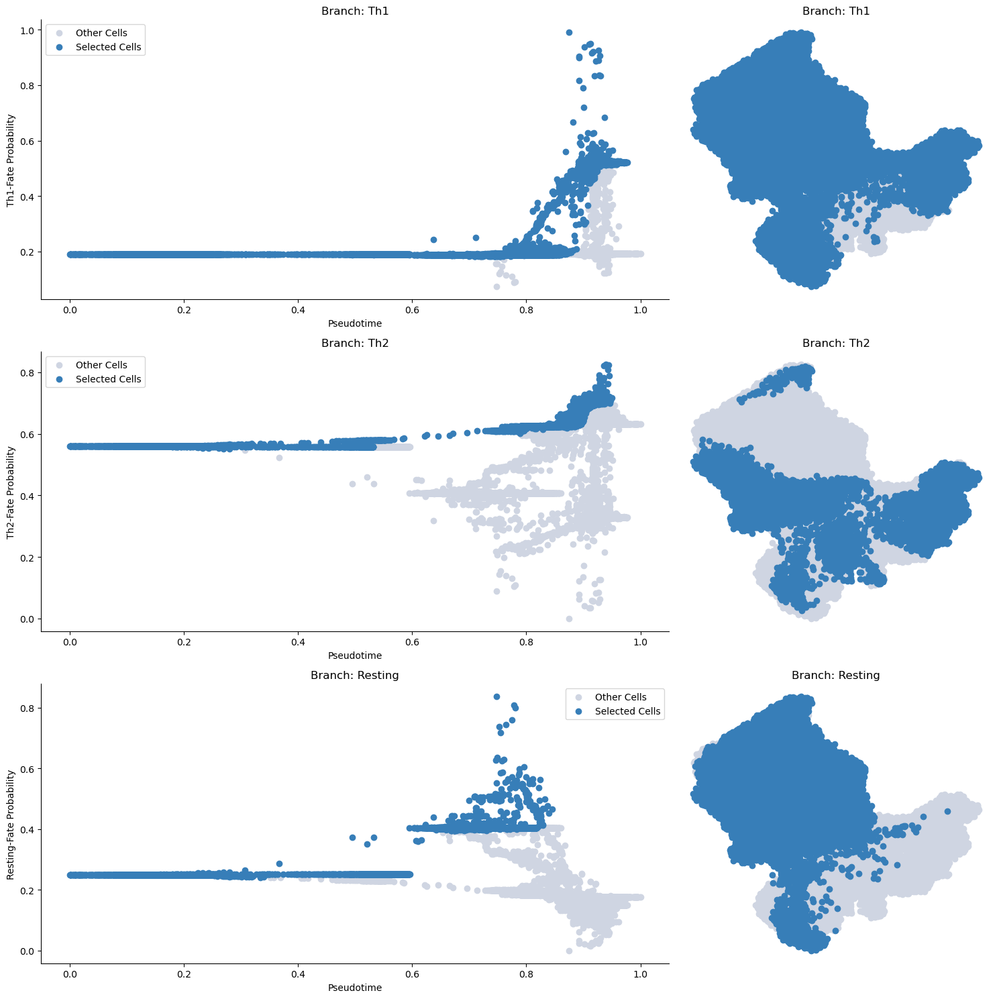

In [27]:
palantir.plot.plot_branch_selection(adata)
plt.show()

In [28]:
pk = cr.kernels.PseudotimeKernel(adata, time_key="palantir_pseudotime")
pk.compute_transition_matrix()

print(pk)

  0%|          | 0/24129 [00:00<?, ?cell/s]

PseudotimeKernel[n=24129]


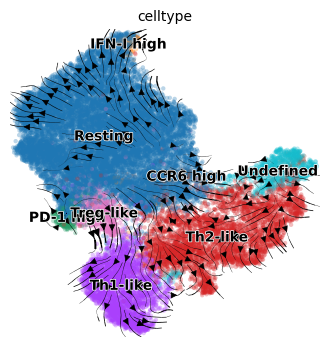

In [29]:
pk.plot_projection(basis="umap",color="celltype", recompute=True)

/tmp/ipykernel_4076120/1539161323.py:12: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.scatterplot(data=df, x='velocity_pseudotime', y='UMAP1', hue='clusters', palette=palette)


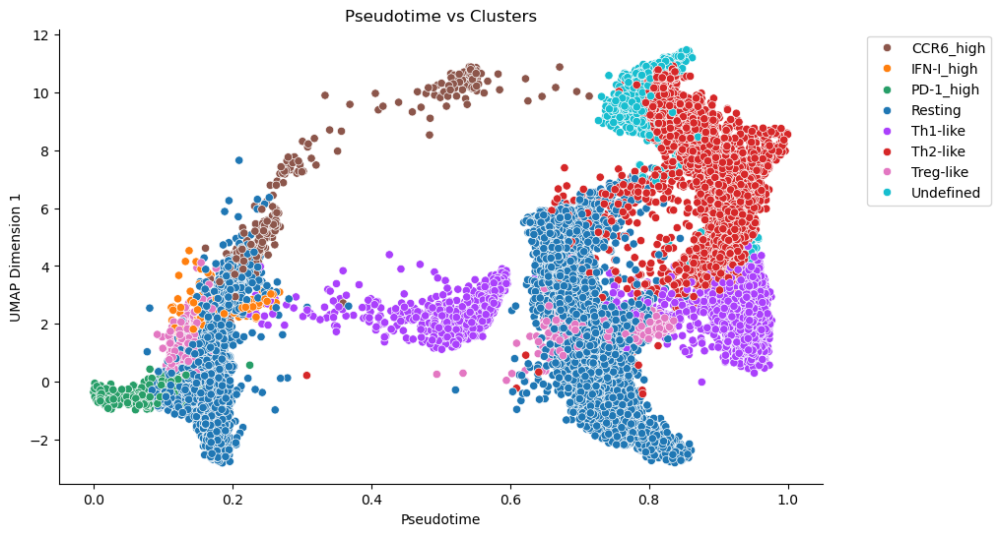

In [30]:
import seaborn as sns
adata.obs['UMAP1'] = adata.obsm['X_umap'][:, 0]
adata.obs['UMAP2'] = adata.obsm['X_umap'][:, 1]

df = adata.obs.copy()
df['velocity_pseudotime'] = adata.obs['palantir_pseudotime']
df['clusters'] = adata.obs['celltype']  # 클러스터 정보


# scatter plot 생성
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='velocity_pseudotime', y='UMAP1', hue='clusters', palette=palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('Pseudotime')
plt.ylabel('UMAP Dimension 1')
plt.title('Pseudotime vs Clusters')
plt.show()

In [33]:
# diffusion map으로 1차 확인
sc.tl.diffmap(adata)
adata.obsm['X_diffmap'][:, 3].argmax()

2398

/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


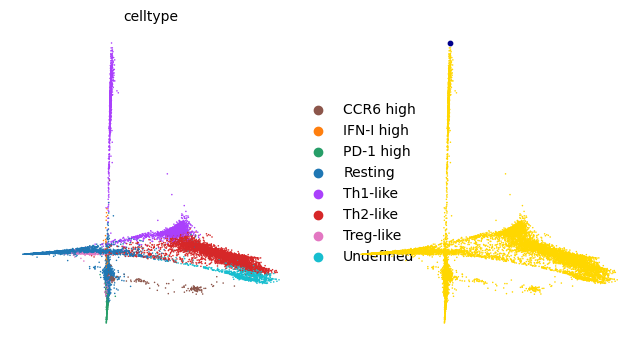

In [35]:
root_ixs = 2398
scv.pl.scatter(
    adata,
    basis="diffmap",
    c=["celltype", root_ixs],
    legend_loc="right",
    components=["2, 3"],
)

adata.uns["iroot"] = root_ixs

# cellrank2 GPCCA algorithm으로 fate prediction

In [36]:
g = cr.estimators.GPCCA(pk)
print(g)

GPCCA[kernel=PseudotimeKernel[n=24129], initial_states=None, terminal_states=None]


/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


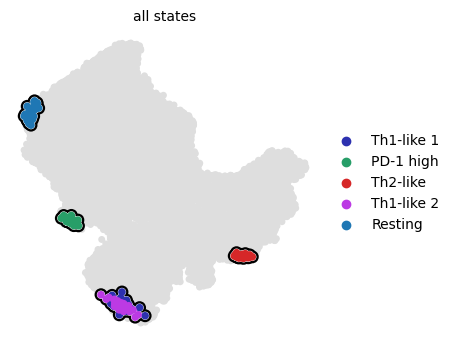

In [37]:
g.fit(cluster_key="celltype", n_states=[4,8])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


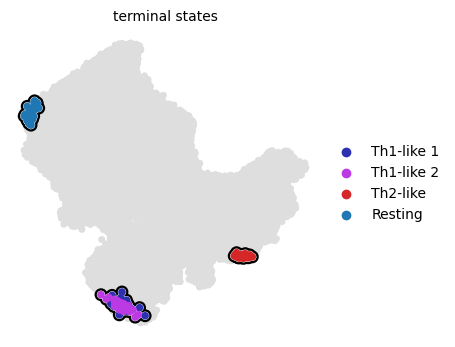

In [39]:
g.set_terminal_states(states=["Th1-like_1","Th1-like_2","Th2-like","Resting"])
g.plot_macrostates(which="terminal", legend_loc="right", size=100)

/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


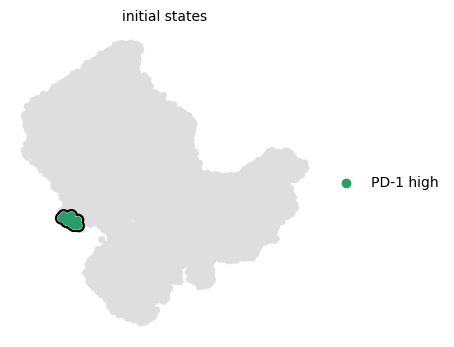

In [40]:
g.predict_initial_states(allow_overlap=True)
g.plot_macrostates(which="initial", legend_loc="right", s=100)

/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


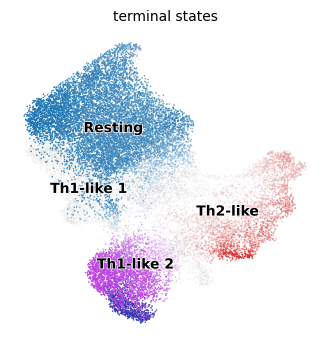

In [41]:
g.plot_macrostates(which="terminal", discrete=False)

  0%|          | 0/4 [00:00<?, ?/s]

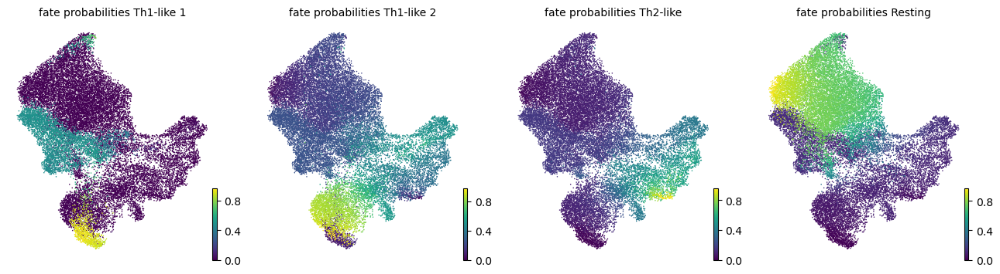

In [42]:
g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

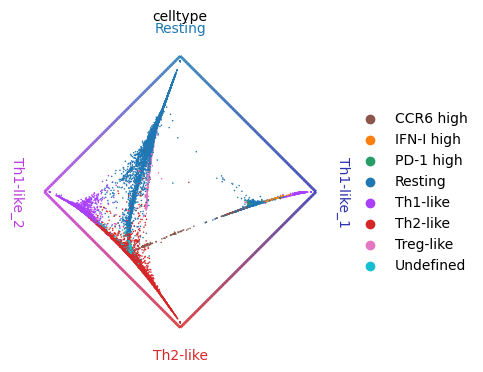

In [43]:
cr.pl.circular_projection(adata, keys=["celltype"], legend_loc="right")

# Driver gene

In [44]:
delta_df2_1 = g.compute_lineage_drivers(
    lineages=["Th2-like"], cluster_key="celltype"
)
delta_df2_1.head(10)

,Th2-like_corr,Th2-like_pval,Th2-like_qval,Th2-like_ci_low,Th2-like_ci_high
Lgals1,0.650791,0.0,0.0,0.643457,0.658005
Pxdc1,0.533976,0.0,0.0,0.524895,0.542936
Icos,0.533136,0.0,0.0,0.524043,0.542107
Irak3,0.529825,0.0,0.0,0.520688,0.538840
Ehd1,0.520713,0.0,0.0,0.511456,0.529849
Il5,0.506186,0.0,0.0,0.496741,0.515511
Serp1,0.474832,0.0,0.0,0.465000,0.484547
Cyp11a1,0.466427,0.0,0.0,0.456496,0.476242
Rilpl2,0.460456,0.0,0.0,0.450456,0.470341
Tpi1,0.458621,0.0,0.0,0.448599,0.468527


In [45]:
delta_df1_1 = g.compute_lineage_drivers(
    lineages=["Th1-like_1"], cluster_key="celltype"
)
delta_df1_1.head(10)

,Th1-like_1_corr,Th1-like_1_pval,Th1-like_1_qval,Th1-like_1_ci_low,Th1-like_1_ci_high
Tmsb10,0.720530,0.0,0.0,0.714407,0.726542
Cd3e,0.573814,0.0,0.0,0.565289,0.582217
Dusp1,0.558730,0.0,0.0,0.549989,0.567348
Pfn1,0.555608,0.0,0.0,0.546824,0.564270
Dtx1,0.555257,0.0,0.0,0.546468,0.563924
Junb,0.545989,0.0,0.0,0.537071,0.554785
Ubb,0.530784,0.0,0.0,0.521660,0.539787
Actb,0.524575,0.0,0.0,0.515368,0.533660
Zfp36,0.520010,0.0,0.0,0.510743,0.529155
Rac2,0.514097,0.0,0.0,0.504754,0.523320


In [46]:
delta_df1_2 = g.compute_lineage_drivers(
    lineages=["Th1-like_2"], cluster_key="celltype"
)
delta_df1_2.head(10)

,Th1-like_2_corr,Th1-like_2_pval,Th1-like_2_qval,Th1-like_2_ci_low,Th1-like_2_ci_high
Cxcr6,0.654750,0.0,0.0,0.647481,0.661899
Id2,0.602150,0.0,0.0,0.594046,0.610132
Ckb,0.557591,0.0,0.0,0.548835,0.566226
Sh3bgrl3,0.481549,0.0,0.0,0.471798,0.491183
Plac8,0.429739,0.0,0.0,0.419395,0.439971
Il2rb,0.426086,0.0,0.0,0.415703,0.436358
Cd226,0.402708,0.0,0.0,0.392082,0.413226
Ctsw,0.396810,0.0,0.0,0.386125,0.407388
Sptssa,0.378475,0.0,0.0,0.367613,0.389234
Satb1,0.370285,0.0,0.0,0.359346,0.381122


In [47]:
delta_df3_1 = g.compute_lineage_drivers(
    lineages=["Resting"], cluster_key="celltype"
)
delta_df3_1.head(10)

,Resting_corr,Resting_pval,Resting_qval,Resting_ci_low,Resting_ci_high
Rps27,0.692051,0.0,0.0,0.685419,0.698569
Rpl12,0.630809,0.0,0.0,0.623151,0.638346
Rps14,0.618086,0.0,0.0,0.610227,0.625823
Rpl13a,0.615366,0.0,0.0,0.607465,0.623145
Rps21,0.592557,0.0,0.0,0.584308,0.600684
Rpl17,0.575888,0.0,0.0,0.567393,0.584260
Rps23,0.572037,0.0,0.0,0.563486,0.580465
Bcl2,0.551649,0.0,0.0,0.542809,0.560366
Rplp2,0.549764,0.0,0.0,0.540898,0.558508
Rps15,0.540274,0.0,0.0,0.531278,0.549149


In [49]:
#driver_clusters = ["Tfh-like","Resting","Th17-like", "Pro", "Th2-like"]

delta_df2_1 = g.compute_lineage_drivers(
    lineages=["Th2-like"], cluster_key="celltype"#, clusters=driver_clusters
)
delta_df1_2 = g.compute_lineage_drivers(
    lineages=["Th1-like_2"], cluster_key="celltype"#, clusters=driver_clusters
)
delta_df1_1 = g.compute_lineage_drivers(
    lineages=["Th1-like_1"], cluster_key="celltype"#, clusters=driver_clusters
)
delta_df3_1 = g.compute_lineage_drivers(
    lineages=["Resting"], cluster_key="celltype"#, clusters=driver_clusters
)

with pd.ExcelWriter("/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Results/lineage_drivers.xlsx") as writer:
    delta_df2_1.to_excel(writer, sheet_name="Th2-like")
    delta_df1_2.to_excel(writer, sheet_name="Th1-like_2")
    delta_df1_1.to_excel(writer, sheet_name="Th1-like_1")
    delta_df3_1.to_excel(writer, sheet_name="Resting")

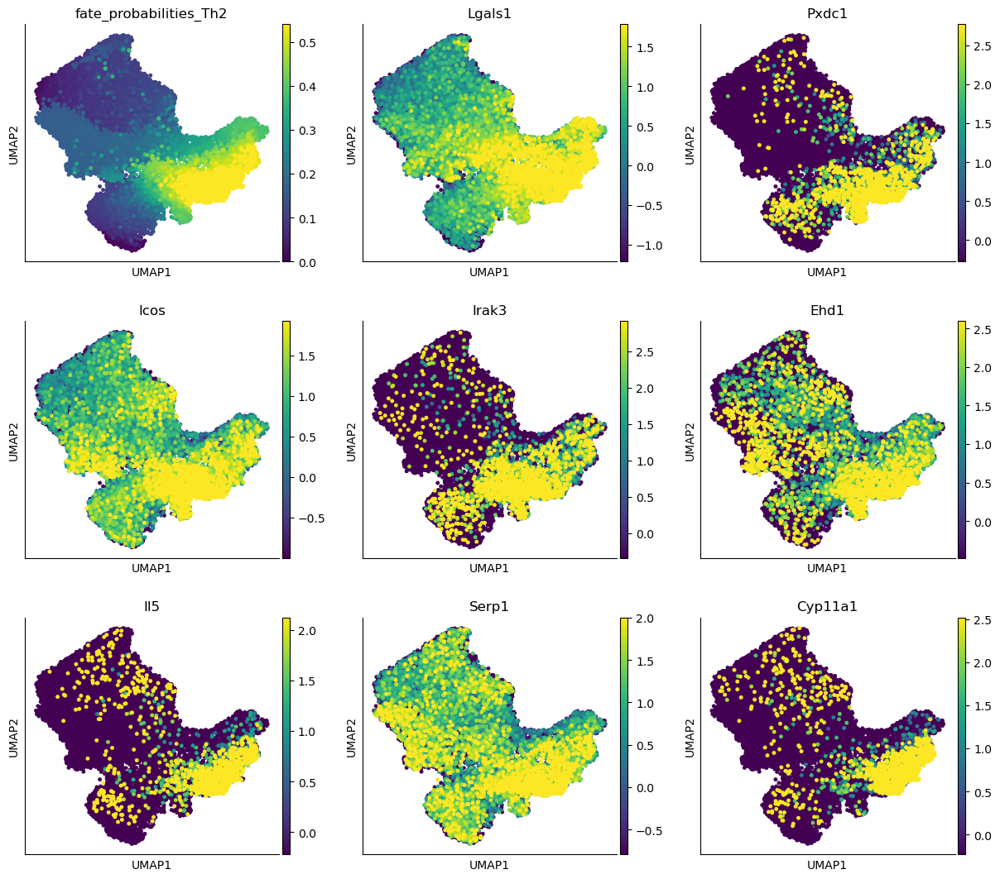

In [50]:
adata.obs["fate_probabilities_Th2"] = g.fate_probabilities["Th2-like"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_Th2"] + list(delta_df2_1.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

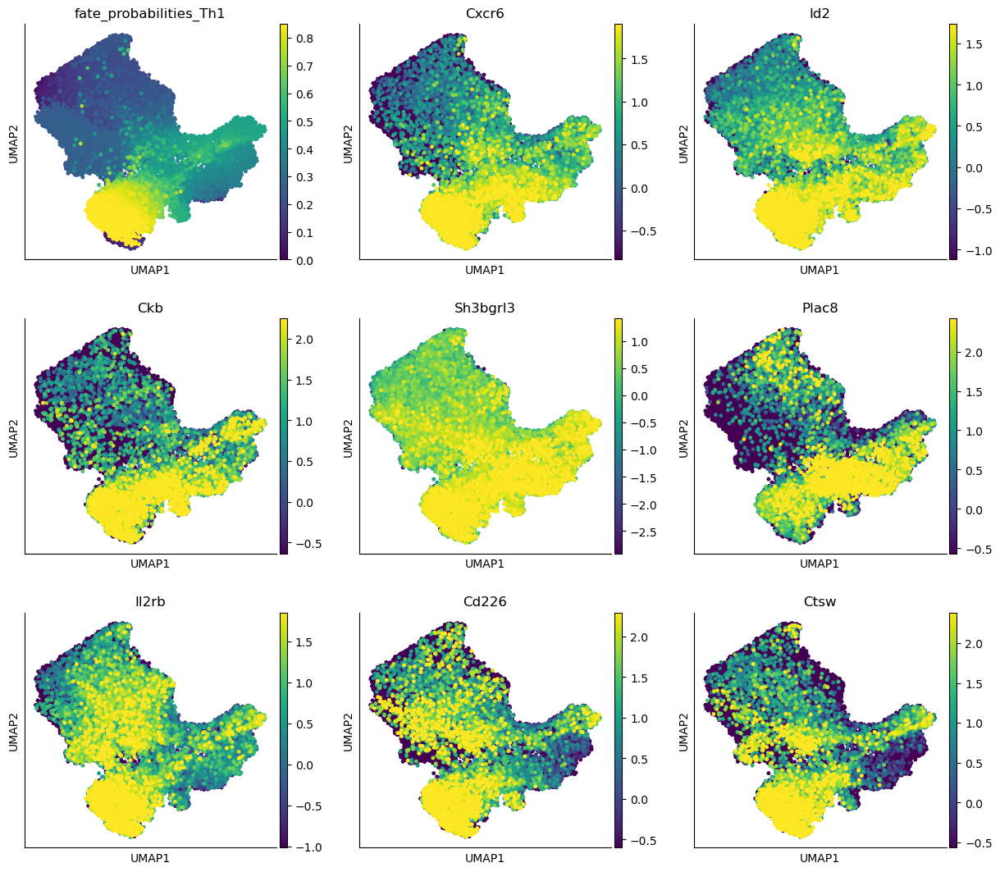

In [63]:
adata.obs["fate_probabilities_Th1"] = g.fate_probabilities["Th1-like_2"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_Th1"] + list(delta_df1_2.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

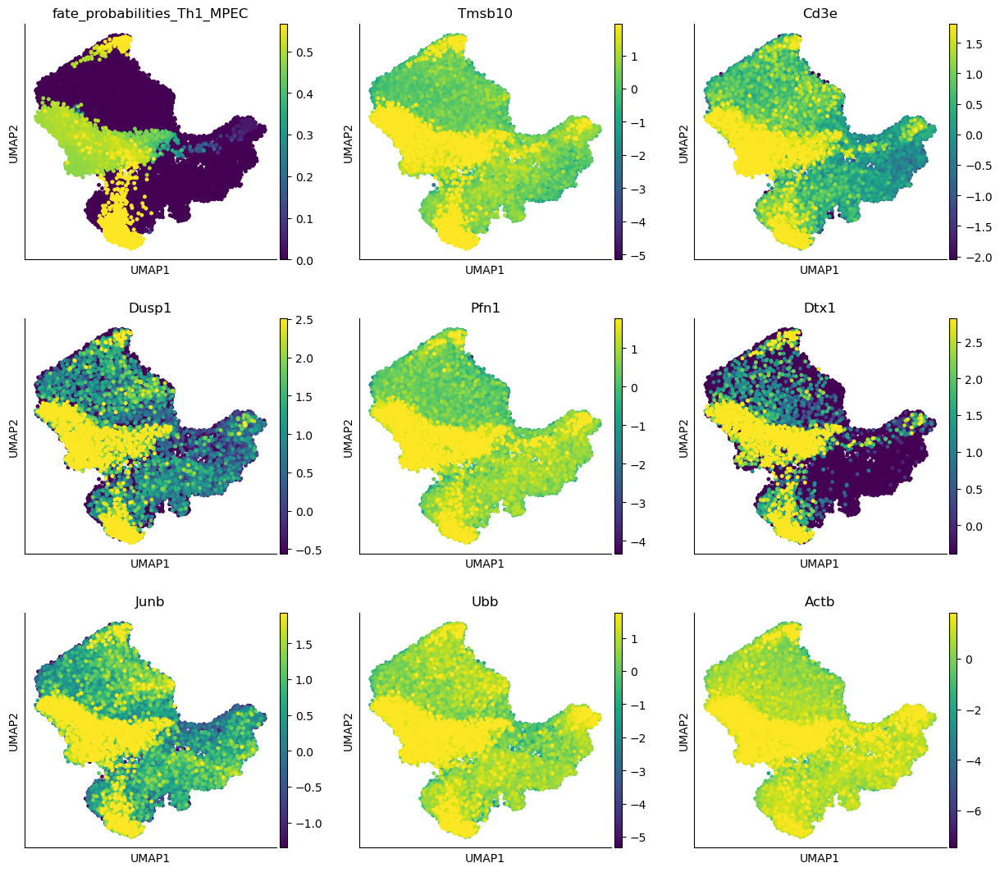

In [65]:
adata.obs["fate_probabilities_Th1_MPEC"] = g.fate_probabilities["Th1-like_1"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_Th1_MPEC"] + list(delta_df1_1.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

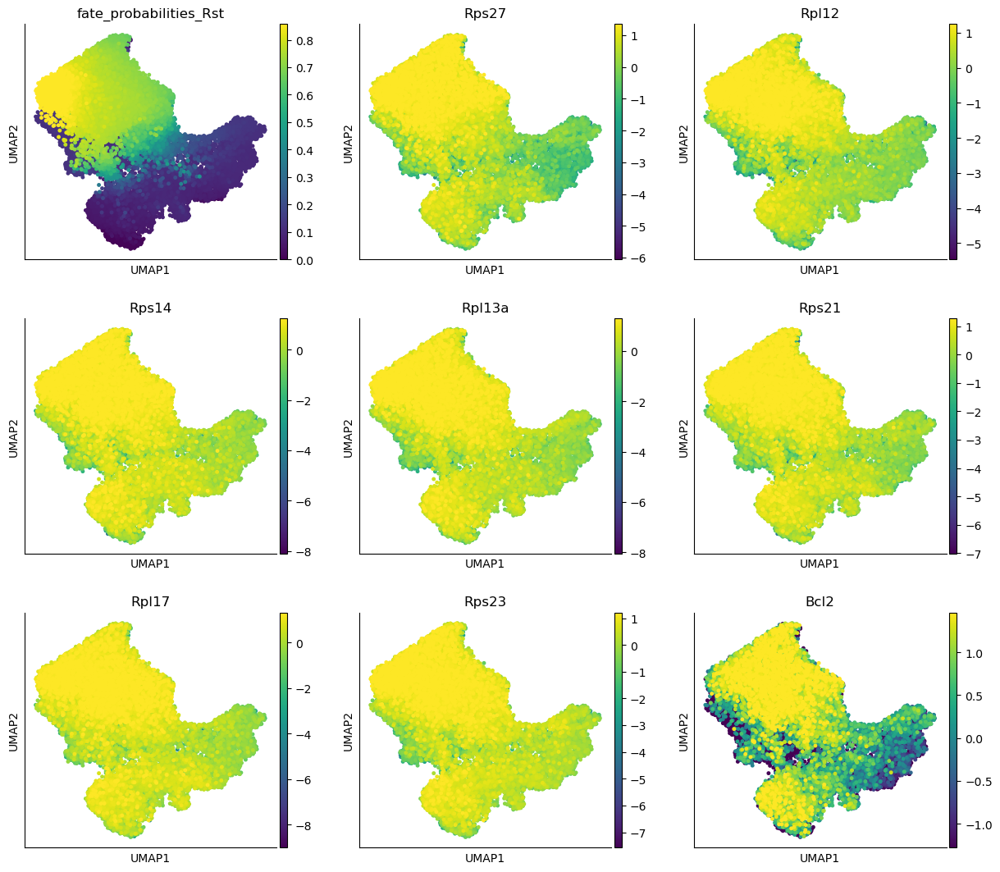

In [66]:
adata.obs["fate_probabilities_Rst"] = g.fate_probabilities["Resting"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_Rst"] + list(delta_df3_1.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

# Gene_trend analysis

In [51]:
import rpy2.robjects as ro

# mgcv 패키지를 로드하고 간단한 R 코드 실행 테스트
ro.r('library(mgcv)')
print(ro.r('R.version.string'))  # R 버전 확인

[1] "R version 4.3.3 (2024-02-29)"



In [52]:
from magic import MAGIC

# MAGIC 적용 및 결과를 `adata.layers`에 추가
magic_operator = MAGIC()
adata.layers["magic_imputed_data"] = magic_operator.fit_transform(adata.X)

Calculating MAGIC...
  Running MAGIC on 24129 cells and 7943 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/magic/magic.py:425: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  warnings.warn(


    Calculated PCA in 2.37 seconds.
    Calculating KNN search...
    Calculated KNN search in 75.24 seconds.
    Calculating affinities...
    Calculated affinities in 74.96 seconds.
  Calculated graph and diffusion operator in 152.62 seconds.
  Running MAGIC with `solver='exact'` on 7943-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 22.38 seconds.
Calculated MAGIC in 175.14 seconds.


In [53]:
model = cr.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0)

  0%|          | 0/6 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


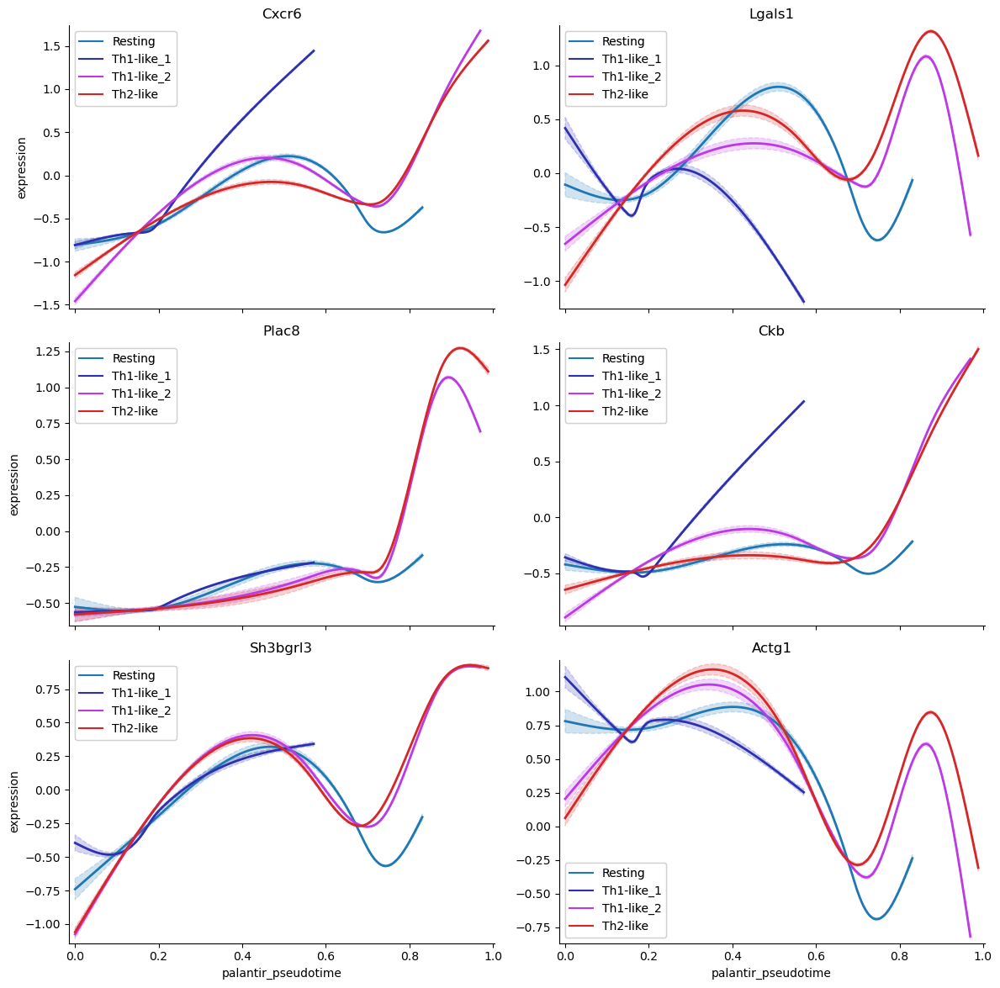

In [54]:
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="magic_imputed_data",
    genes=["Cxcr6","Lgals1","Plac8","Ckb","Sh3bgrl3","Actg1"],
    same_plot=True,
    ncols=2,
    time_key="palantir_pseudotime",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/7943 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


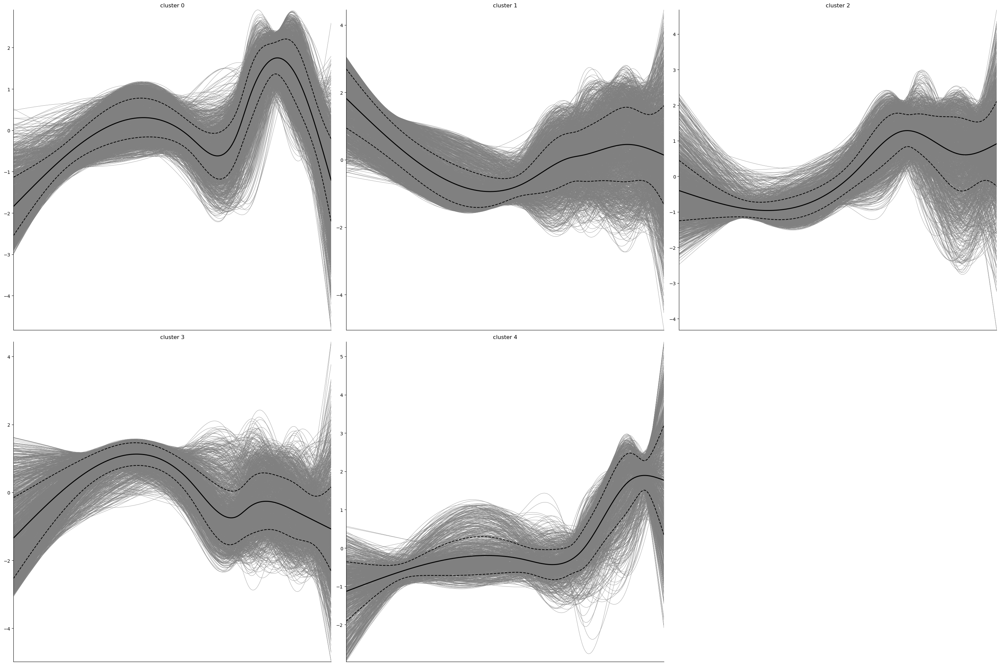

In [72]:
cr.pl.cluster_trends(
    adata,
    model=model,  # use the model from before
    lineage="Th2-like",
    data_key="magic_imputed_data",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="palantir_pseudotime",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=8,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)

In [56]:
adata

AnnData object with n_obs × n_vars = 24129 × 7943
    obs: 'n_counts', 'n_genes', 'mt_counts', 'mt_frac', 'batch', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'celltype_detail', 'celltype', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'UMAP1', 'UMAP2', 'palantir_pseudotime', 'palantir_entropy', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'clusters_gradients', 'fate_probabilities_Th2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'celltype_colors', 'celltype_detail_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'tsne', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'DM_EigenValues', 'palantir_waypoints', 'T_fwd_params', 'diffmap_evals', 'iroot', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd', 'term_states_fwd_colors', 'init_states_fwd_

/home/jaehyunchoi/.conda/envs/cellrank2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


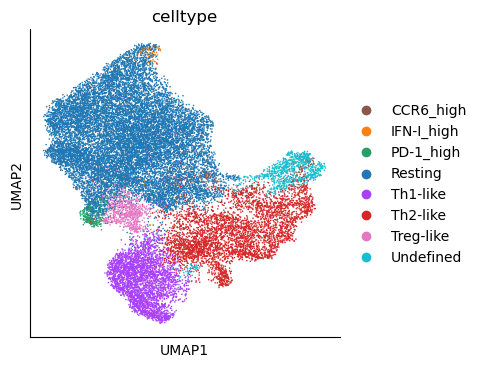

In [59]:
sc.pl.umap(adata, color = 'celltype')

In [60]:
# 카테고리로 변환 + 원하는 순서 지정 (scanpy 기준)
if not pd.api.types.is_categorical_dtype(adata.obs['celltype']):
    adata.obs['celltype'] = adata.obs['celltype'].astype('category')

# 정렬 순서 (scanpy 기준 유지)
categories_order = adata.obs['celltype'].cat.categories
# scanpy에서 쓰는 color list 그대로 쓰기
colors = adata.uns['celltype_colors']  # 예: ['#1f77b4', '#ff7f0e', ...]

# 카테고리 순서에 맞춰 딕셔너리 만들기
color_dict = dict(zip(categories_order, colors))

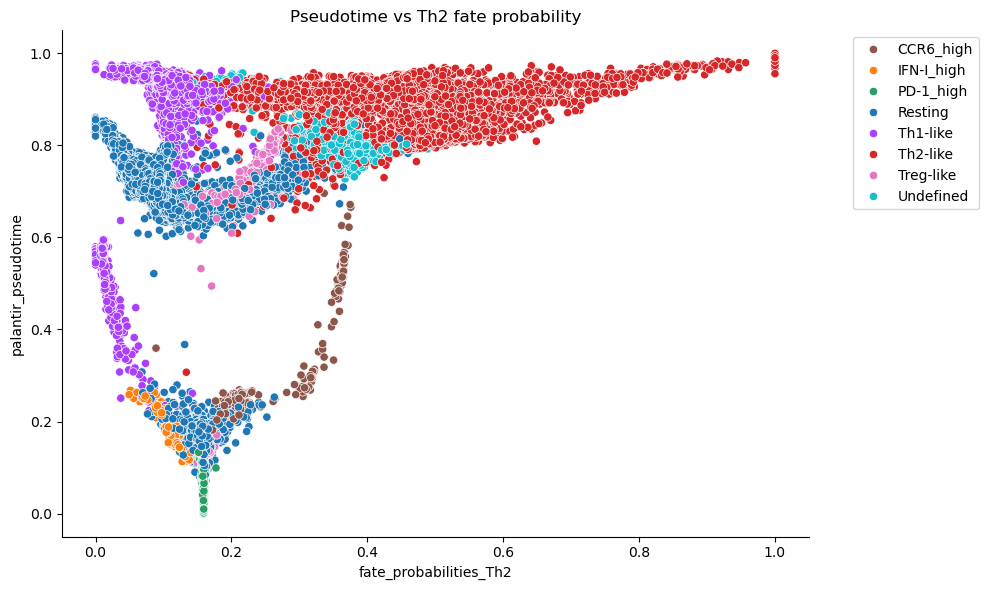

In [61]:
df = adata.obs.copy()
df['fate_probabilities_Th2'] = adata.obs['fate_probabilities_Th2']
df['palantir_pseudotime'] = adata.obs['palantir_pseudotime']
df['clusters'] = adata.obs['celltype']  # 이미 카테고리화됨

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='fate_probabilities_Th2',
    y='palantir_pseudotime',
    hue='clusters',
    palette=color_dict  # 순서 맞춘 dict
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('fate_probabilities_Th2')
plt.ylabel('palantir_pseudotime')
plt.title('Pseudotime vs Th2 fate probability')
plt.tight_layout()
plt.show()

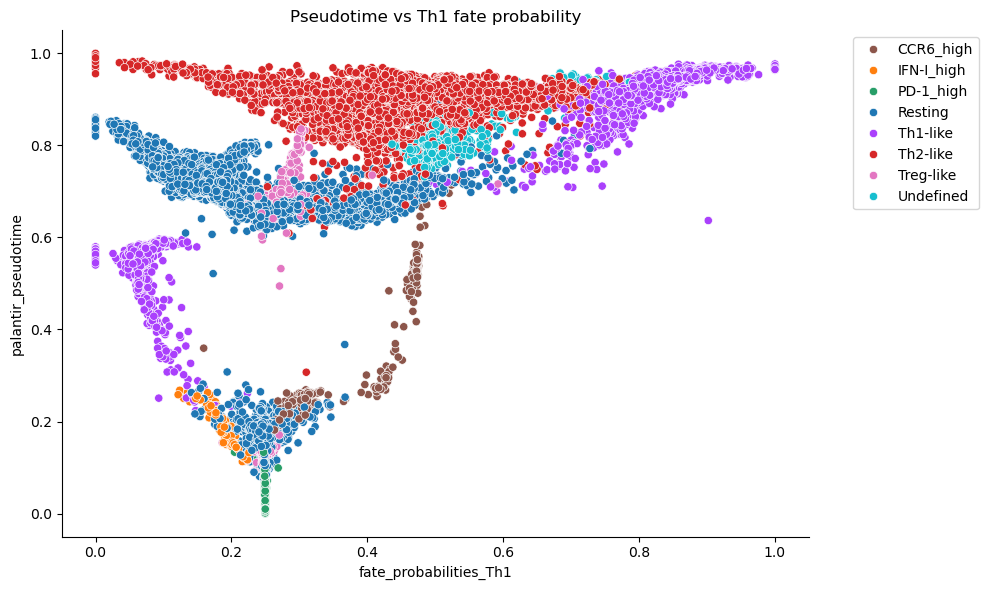

In [67]:
df = adata.obs.copy()
df['fate_probabilities_Th1'] = adata.obs['fate_probabilities_Th1']
df['palantir_pseudotime'] = adata.obs['palantir_pseudotime']
df['clusters'] = adata.obs['celltype']  # 이미 카테고리화됨

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='fate_probabilities_Th1',
    y='palantir_pseudotime',
    hue='clusters',
    palette=color_dict  # 순서 맞춘 dict
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('fate_probabilities_Th1')
plt.ylabel('palantir_pseudotime')
plt.title('Pseudotime vs Th1 fate probability')
plt.tight_layout()
plt.show()

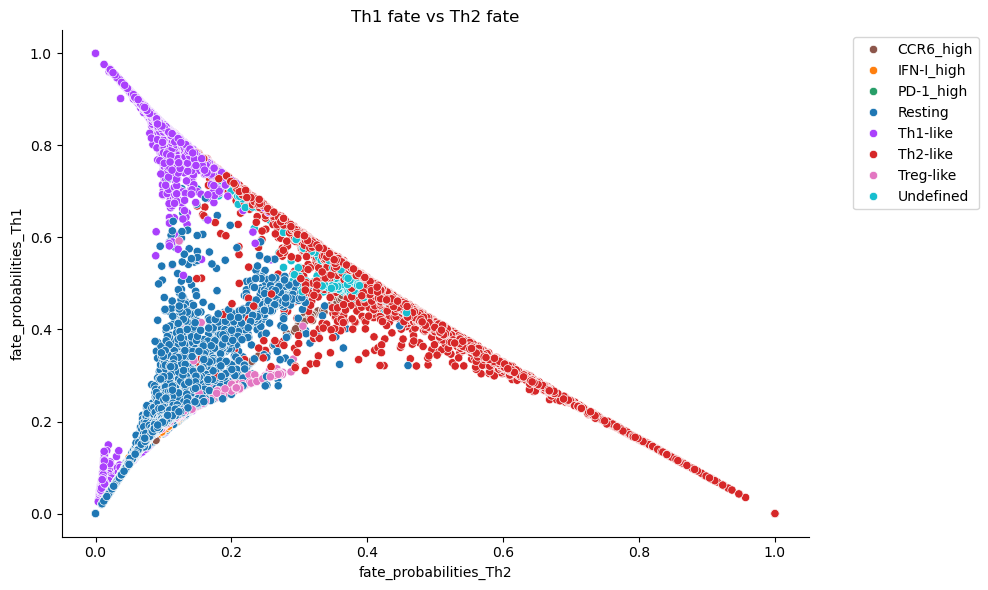

In [68]:
df = adata.obs.copy()
df['fate_probabilities_Th1'] = adata.obs['fate_probabilities_Th1']
df['fate_probabilities_Th2'] = adata.obs['fate_probabilities_Th2']
df['clusters'] = adata.obs['celltype']  # 이미 카테고리화됨

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='fate_probabilities_Th2',
    y='fate_probabilities_Th1',
    hue='clusters',
    palette=color_dict  # 순서 맞춘 dict
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('fate_probabilities_Th2')
plt.ylabel('fate_probabilities_Th1')
plt.title('Th1 fate vs Th2 fate')
plt.tight_layout()
plt.show()

# 3D map of fate lineage

In [70]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 클러스터 이름 순서에 맞게 색상 매핑 (중요!)
cluster_categories = df['clusters'].astype('category').cat.categories
cluster_color_map = dict(zip(cluster_categories, adata.uns['celltype_colors']))

# 각 세포에 맞는 색상 리스트 생성
cell_colors = df['clusters'].map(cluster_color_map)

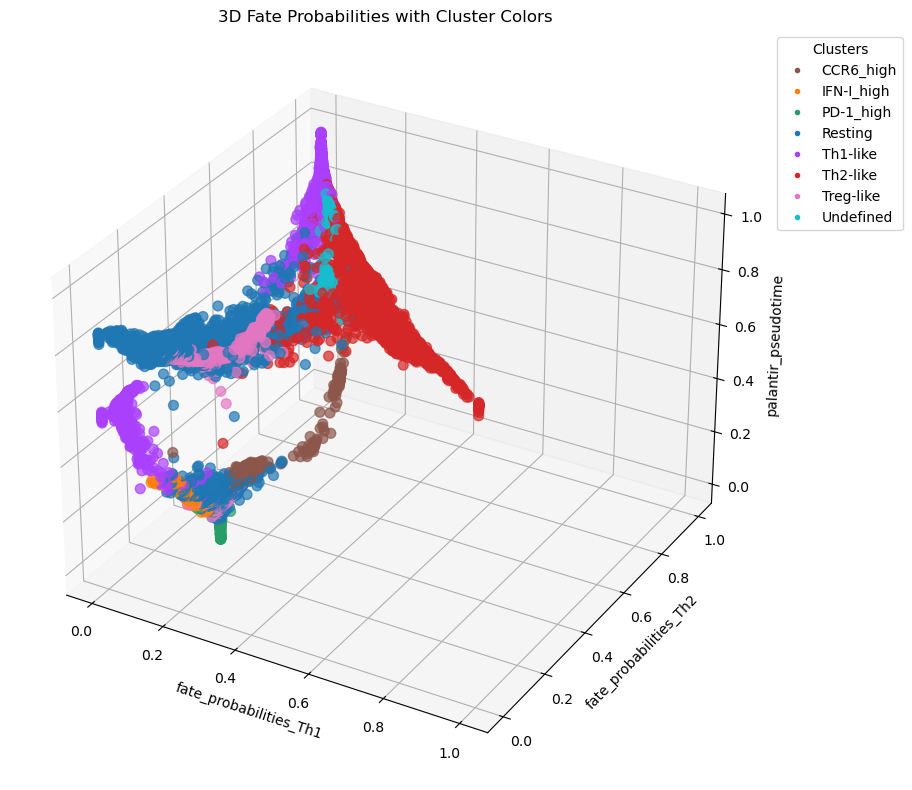

In [71]:
# 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df['fate_probabilities_Th2'],
    df['fate_probabilities_Th1'],
    df['palantir_pseudotime'],
    c=cell_colors,
    alpha=0.7,
    s=50
)

# 축 라벨
ax.set_xlabel('fate_probabilities_Th1')
ax.set_ylabel('fate_probabilities_Th2')
ax.set_zlabel('palantir_pseudotime')
ax.set_title('3D Fate Probabilities with Cluster Colors')

# 범례 만들기
legend_handles = [
    plt.Line2D([0], [0], marker='o', color=color, label=cluster,
               markersize=3, linestyle='') 
    for cluster, color in cluster_color_map.items()
]
ax.legend(handles=legend_handles, title='Clusters', bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.show()

In [73]:
adata.write("/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Data/Byst_cellrank.h5ad")